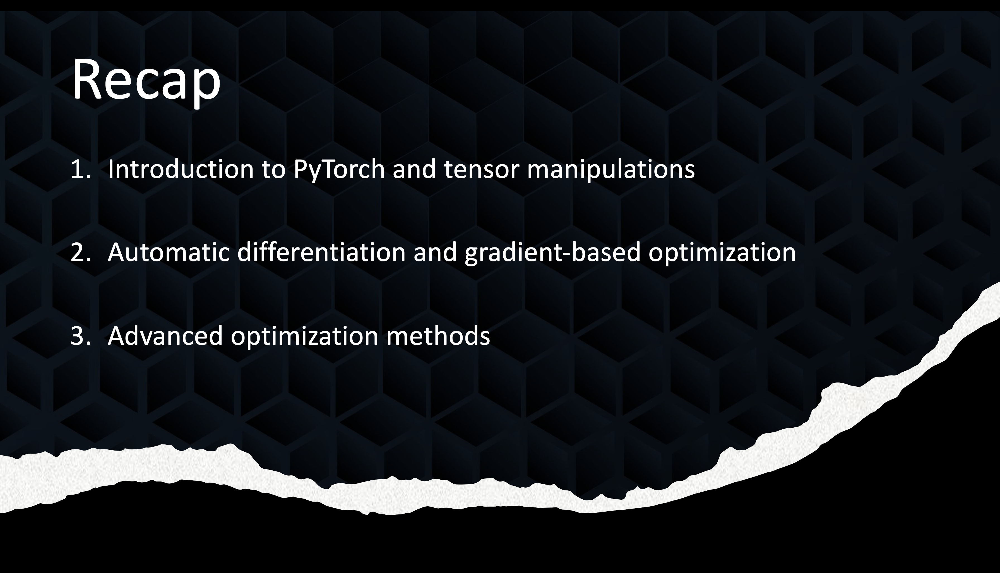

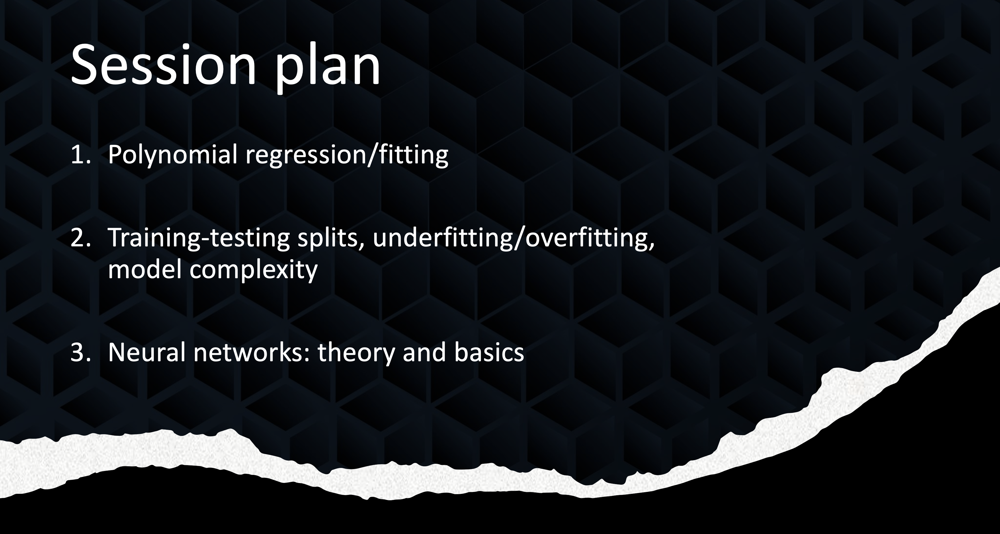

In [1]:
# imports:  
import torch
import numpy as np
import matplotlib.pyplot as plt
torch.manual_seed(0);

# Fitting a polynomial to some data

In [2]:
# Hidden function that we want to learn
def func(x):
    # E.g.,: sin(2*pi*x)
    pi = np.pi
    val = torch.sin(2*pi*x)
    return val
    

### Training-data: *data used for fitting*

Generate some FAKE "x" data where measurements 'y' are made. In ML, "x" is usually called features , while "y" are called labels.

x_train:  tensor([[0.0000],
        [0.2000],
        [0.4000],
        [0.6000],
        [0.8000],
        [1.0000]])
y_train:  tensor([[ 0.0000e+00],
        [ 9.5106e-01],
        [ 5.8779e-01],
        [-5.8779e-01],
        [-9.5106e-01],
        [ 1.7485e-07]])


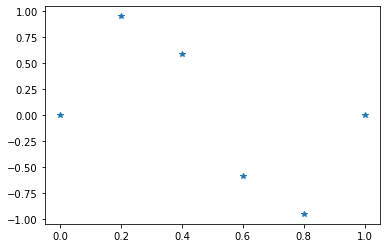

In [3]:
# Number of data points:
n_train = 6

# Generate x-data by choosing uniformly-spaced n points in [0,1]
# Make sure that number that data is arranged ROW-wise
x_train = torch.linspace(start=0., end=1., steps=n_train).unsqueeze(-1)

# Generate true y-data using func
y_train = func(x_train)

#------------------------------------------------------------
print('x_train: ', x_train)
print('y_train: ', y_train)

plt.plot(x_train, y_train,linestyle = 'None',marker='*')

### Test-data: *data used for testing the accuracy of the trained model; NEVER use test data for training/fitting*

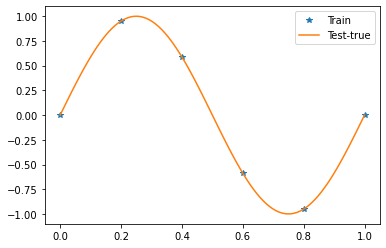

In [4]:
# Number of data points:
n_test = 100

# Generate x-data by choosing uniformly-spaced n points in [0,1]
# Make sure that number that data is arranged ROW-wise
x_test = torch.linspace(start=0., end=1., steps=n_test).unsqueeze(-1)

# Generate true y-data using func
y_test = func(x_test)

#------------------------------------------------------------
plt.plot(x_train, y_train,linestyle = 'None',marker='*')
plt.plot(x_test, y_test)
plt.legend(['Train','Test-true'])

### Create a polynomial fitting model: $y=\alpha_0 + \alpha_1 x + \alpha_2 x^2 + \dots + \alpha_{d-1} x^{d-1} + x^d$

In [5]:
# Degree of polynomial
d = 6

# Polynomial coefficients: these are your unknowns that need to be estimated based on the data
alpha = torch.zeros(d) 

#------------------------------------------------------------
print('alpha: ',alpha)


alpha:  tensor([0., 0., 0., 0., 0., 0.])


In [6]:
# Create a function to make a prediction given some alpha and x
def model(alpha, x):
    y = x**d
    for i in range(d):
        y += alpha[i] * (x**i)
    return y
    

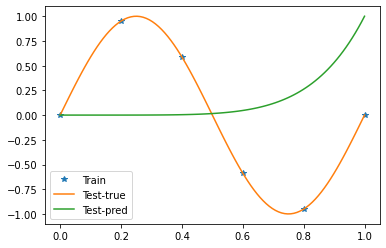

In [7]:
# Make a prediction on the test data
y_test_pred = model(alpha, x_test)

#------------------------------------------------------------
plt.plot(x_train, y_train,linestyle = 'None',marker='*')
plt.plot(x_test, y_test)
plt.plot(x_test, y_test_pred)
plt.legend(['Train','Test-true','Test-pred'])

### Now, let's train the model, i.e., find the best values of alpha to fit the data

In [12]:
# Define an empty list to store loss history
train_loss_history = []
test_loss_history = []

# Since, we want to find the value of alpha using optimization, set .requires_grad to True for alpha
alpha = torch.zeros(d) 
alpha.requires_grad = True

# Learning rate of 0.01
lr = 0.01

# Optimizer: use Adam
optimizer = torch.optim.Adam([alpha], lr=lr)

# Loss function: use the MEAN SQUARED ERROR (MSE) as loss
loss_function = torch.nn.MSELoss()

# number of steps, the proper term is 'EPOCH', use 10000
num_epochs = 10000

# begin iterating over epochs
for epoch in range(num_epochs):
    
    # Make your predictions, USE TRAINING DATA ONLY!!
    y_train_pred = model(alpha, x_train)
    
    # Compute the training loss
    train_loss = loss_function(y_train_pred, y_train)
    
    # store the loss in a list
    train_loss_history.append(train_loss.detach().item())
    
    
    # Call .backward() on loss to compute gradient (d_loss/d_a)
    train_loss.backward()
            
    # Update the model paramaeters (in this case: alpha)
    # No need for torch.no_grad() anymore with in-built optimizers
    optimizer.step()
    
    # remove any pre-exisitng gradients stored
    optimizer.zero_grad()
    
    # We also track the loss on test data but don't use that information for training (just for monitoring purpose)
    with torch.no_grad(): #torch.no_grad() is back because we don't train on test data and so don't need gradients
        
        # Make your predictions
        y_test_pred = model(alpha, x_test)
        
        # Compute the loss. 
        test_loss = loss_function(y_test_pred, y_test)
        
        # store the loss in a list
        test_loss_history.append(test_loss.detach().item())
    
        

In [13]:
# Print trained model parameters:
alpha

tensor([ 1.1074e-02,  9.0499e+00, -2.3201e+01,  4.4166e+00,  1.4560e+01,
        -5.8226e+00], requires_grad=True)

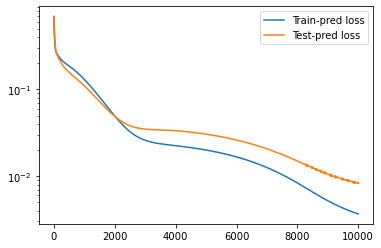

In [14]:
plt.plot(train_loss_history)
plt.plot(test_loss_history)
plt.legend(['Train-pred loss','Test-pred loss'])
plt.yscale('log')

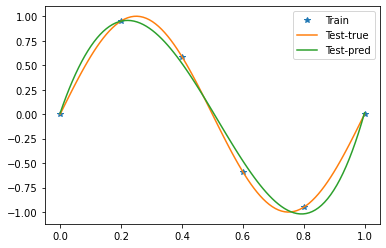

In [15]:
# Make a prediction on the test data
with torch.no_grad(): #torch.no_grad() is back because we don't need gradients anymore during testing phase
    y_test_pred = model(alpha, x_test)
    

#------------------------------------------------------------
plt.plot(x_train, y_train,linestyle = 'None',marker='*')
plt.plot(x_test, y_test)
plt.plot(x_test, y_test_pred)
plt.legend(['Train','Test-true','Test-pred'])